In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import pandas as pd
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import dask.dataframe as dd
import plotly.express as px
import datetime as dt

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
import matplotlib.colors

In [0]:
file_directory = ""

df_tariff = pd.read_csv(os.path.join(file_directory,"Tariffs.csv"))
df_tariff.head()

,TariffDateTime,Tariff
0,1/1/2013 0:00,Normal
1,1/1/2013 0:30,Normal
2,1/1/2013 1:00,Normal
3,1/1/2013 1:30,Normal
4,1/1/2013 2:00,Normal


In [0]:
df_tariff['TariffDateTime'] = pd.to_datetime(df_tariff['TariffDateTime'])
# df_tariff["Day"] = df_tariff["TariffDateTime"].apply(lambda x: x.day)
# df_tariff["Month"] = df_tariff["TariffDateTime"].apply(lambda x: x.month)
# df_tariff["Hour"] = df_tariff["TariffDateTime"].apply(lambda x: x.hour)
# df_tariff["minute"] = df_tariff["TariffDateTime"].apply(lambda x: x.minute)
df_tariff['TariffDateTime'] = df_tariff['TariffDateTime'].apply(lambda x: str(x.minute) + '-' + str(x.hour) + '-' + str(x.day) + '-' + str(x.month))
df_tariff.set_index('TariffDateTime', inplace=True)
df_tariff.head()

,Tariff
TariffDateTime,
0-0-1-1,Normal
30-0-1-1,Normal
0-1-1-1,Normal
30-1-1-1,Normal
0-2-1-1,Normal
...,...
30-21-31-12,Normal
0-22-31-12,Normal
30-22-31-12,Normal


In [0]:
df = pd.read_pickle("./completedata.pkl")

In [0]:
df['DateTime'] = pd.to_datetime(df['DateTime'])

In [0]:
df2 = pd.read_pickle("./dynamicdatapickle.pkl")

In [0]:
df2['DateTime'] = pd.to_datetime(df2['DateTime'])

In [0]:
def fetchtype(x):
  key = str(x.minute) + '-' + str(x.hour) + '-' + str(x.day) + '-' + str(x.month)
  try:
    val_df = df_tariff.loc[key,'Tariff']
    return val_df
  except KeyError:
    return np.nan

In [0]:
df2["Std type"] = df2["DateTime"].apply(fetchtype)

In [0]:
df.head()

,LCLid,DateTime,KWH/hh,Acorn Grouped
0,MAC000002,2012-10-12 00:30:00,0.0,Affluent
1,MAC000002,2012-10-12 01:00:00,0.0,Affluent
2,MAC000002,2012-10-12 01:30:00,0.0,Affluent
3,MAC000002,2012-10-12 02:00:00,0.0,Affluent
4,MAC000002,2012-10-12 02:30:00,0.0,Affluent


In [0]:
df2.head()

,LCLid,stdorToU,DateTime,KWH/hh,Acorn Grouped,Std type
0,MAC005470,ToU,2012-07-04 21:00:00,0.180,Affluent,Normal
1,MAC005470,ToU,2012-07-04 21:30:00,0.104,Affluent,Normal
2,MAC005470,ToU,2012-07-04 22:00:00,0.118,Affluent,Normal
3,MAC005470,ToU,2012-07-04 22:30:00,0.154,Affluent,Normal
4,MAC005470,ToU,2012-07-04 23:00:00,0.026,Affluent,Normal


## Clustering of customer with weather

### Standard User with Acorn group

In [0]:
groupby = df.groupby(['LCLid',pd.Grouper(key="DateTime",freq='M'),"Acorn Grouped"])["KWH/hh"].mean()

In [0]:
groupby= groupby.reset_index()

In [0]:
groupby.head()

,LCLid,DateTime,Acorn Grouped,KWH/hh
0,MAC000002,2012-10-31,Affluent,0.289620
1,MAC000002,2012-11-30,Affluent,0.247859
2,MAC000002,2012-12-31,Affluent,0.239087
3,MAC000002,2013-01-31,Affluent,0.241828
4,MAC000002,2013-02-28,Affluent,0.283894


In [0]:
groupby["month"] = groupby["DateTime"].dt.month

In [0]:
groupby = groupby.groupby(['LCLid',"month","Acorn Grouped"])["KWH/hh"].mean()

In [0]:
groupby = groupby.reset_index()

In [0]:
groupby.head()

,LCLid,month,Acorn Grouped,KWH/hh
0,MAC000002,1,Affluent,0.285615
1,MAC000002,2,Affluent,0.301769
2,MAC000002,3,Affluent,0.322478
3,MAC000002,4,Affluent,0.251724
4,MAC000002,5,Affluent,0.204207


In [0]:
len(groupby)

36220

In [0]:
groupby["month"].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [0]:
unique_user = groupby["LCLid"].unique()
new_df_list = []
for user in unique_user:
    user_detail = groupby[groupby["LCLid"]==user]
    weather = ["Su","W","Sp","A"]
    summer = 0
    winter = 0
    spring = 0
    autumn = 0
    acorn = user_detail["Acorn Grouped"].unique()[0]
    for w in weather:
        if (w == "Su"):
            val1 = user_detail[user_detail["month"]==6]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==7]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==8]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            summer = val1[0] + val2[0] + val3[0]
        elif (w == "W"):
            val1 = user_detail[user_detail["month"]==12]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==1]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==2]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            winter = val1[0] + val2[0] + val3[0]
        elif (w == "Sp"):
            val1 = user_detail[user_detail["month"]==3]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==4]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==5]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            spring = val1[0] + val2[0] + val3[0]
        else:
            val1 = user_detail[user_detail["month"]==9]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==10]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==11]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            autumn = val1[0] + val2[0] + val3[0]
    data = {"LCLid":[user],"Summer":[summer],"Winter":[winter],"Spring":[spring],"Autumn":[autumn], "Acorn_group":[acorn]}
    new_df = pd.DataFrame(data)
    new_df_list.append(new_df)
    del new_df

In [0]:
new_df = pd.concat(new_df_list)

In [0]:
len(new_df)

3043

In [0]:
new_df.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group
0,MAC000002,0.571854,0.833510,0.778410,0.761370,Affluent
0,MAC000003,0.765520,1.698861,1.173445,1.080151,Adversity
0,MAC000004,0.095731,0.115601,0.107319,0.107810,Affluent
0,MAC000006,0.153897,0.192760,0.183457,0.186135,Adversity
0,MAC000007,0.513453,0.659852,0.653722,0.519475,Comfortable


In [0]:
standard_cus = new_df.copy()

In [0]:
new_df2 = new_df[["Summer","Winter","Spring","Autumn","Acorn_group"]]

In [0]:
new_df2

,Summer,Winter,Spring,Autumn,Acorn_group
0,0.571854,0.833510,0.778410,0.761370,Affluent
0,0.765520,1.698861,1.173445,1.080151,Adversity
0,0.095731,0.115601,0.107319,0.107810,Affluent
0,0.153897,0.192760,0.183457,0.186135,Adversity
0,0.513453,0.659852,0.653722,0.519475,Comfortable
...,...,...,...,...,...
0,0.582960,0.596542,0.644196,0.644841,Comfortable
0,0.618500,0.777264,0.731500,0.599101,Adversity
0,0.344917,0.485885,0.419807,0.454781,Affluent
0,0.546446,0.689956,0.641188,0.545845,Adversity


In [0]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
new_df2["Acorn_group"] = le.fit_transform(new_df2["Acorn_group"])

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [0]:
new_df2.head()

,Summer,Winter,Spring,Autumn,Acorn_group
0,0.571854,0.833510,0.778410,0.761370,2
0,0.765520,1.698861,1.173445,1.080151,1
0,0.095731,0.115601,0.107319,0.107810,2
0,0.153897,0.192760,0.183457,0.186135,1
0,0.513453,0.659852,0.653722,0.519475,3


In [0]:
from sklearn import preprocessing
from sklearn.cluster import KMeans 

X = new_df2.values
W = preprocessing.normalize(X)

In [0]:
cluster = KMeans(n_clusters=2, n_init=12)
cluster = cluster.fit(W)
labels = cluster.labels_
print (labels)

[1 1 0 ... 0 1 0]


In [0]:
new_df["cluster"] = labels

In [0]:
new_df.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,cluster
0,MAC000002,0.571854,0.833510,0.778410,0.761370,Affluent,1
0,MAC000003,0.765520,1.698861,1.173445,1.080151,Adversity,1
0,MAC000004,0.095731,0.115601,0.107319,0.107810,Affluent,0
0,MAC000006,0.153897,0.192760,0.183457,0.186135,Adversity,0
0,MAC000007,0.513453,0.659852,0.653722,0.519475,Comfortable,0


In [0]:
cluster_type = [0,1]
y_axis = []
for c in cluster_type:
    c_data = new_df[new_df["cluster"]==c]
    display(c_data.head())
    su = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Summer"]
    sp = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Spring"]   
    a = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Autumn"]    
    w = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Winter"]   
    
    new_data = [w,sp,su,a]
    y_axis.append(new_data)

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,cluster
0,MAC000004,0.095731,0.115601,0.107319,0.107810,Affluent,0
0,MAC000006,0.153897,0.192760,0.183457,0.186135,Adversity,0
0,MAC000007,0.513453,0.659852,0.653722,0.519475,Comfortable,0
0,MAC000012,0.082506,0.077441,0.145898,0.212225,Affluent,0
0,MAC000013,0.313104,0.363265,0.331456,0.317565,Adversity,0


,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,cluster
0,MAC000002,0.571854,0.833510,0.778410,0.761370,Affluent,1
0,MAC000003,0.765520,1.698861,1.173445,1.080151,Adversity,1
0,MAC000008,0.978356,1.354532,1.210996,1.030610,Comfortable,1
0,MAC000009,0.448703,0.598103,0.482813,0.545847,Adversity,1
0,MAC000010,1.410513,1.895875,1.563577,1.567246,Comfortable,1


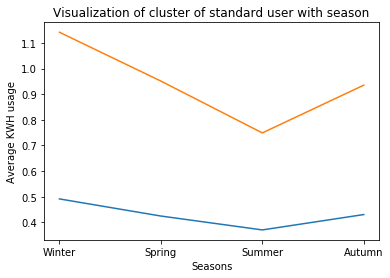

In [0]:
import matplotlib.pyplot as plt
plt.plot(["Winter", "Spring", "Summer", "Autumn"],y_axis[0], label="cluster 1")
plt.plot(["Winter", "Spring", "Summer", "Autumn"],y_axis[1], label="cluster 2")
plt.xlabel("Seasons")
plt.ylabel("Average KWH usage")
plt.title("Visualization of cluster of standard user with season")
plt.show()

In [0]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

sillhoute_scores = []
n_cluster = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]

X = new_df[["Summer","Winter","Spring","Autumn"]].values.copy()
    
# Very important to scale!
sc = MinMaxScaler()
X = sc.fit_transform(X)

for n_cluster in n_cluster:    
    kmeans = KMeans(n_clusters=n_cluster)
    cluster_found = kmeans.fit_predict(X)
    sillhoute_scores.append(silhouette_score(X, kmeans.labels_))

Text(0.5, 1.0, 'Finding ideal number of clusters for standard user')

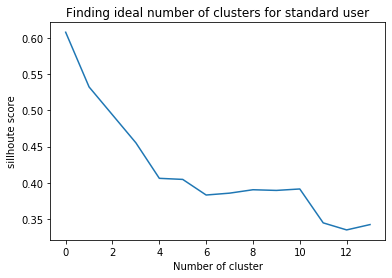

In [0]:
plt.plot(sillhoute_scores)
plt.xlabel("Number of cluster")
plt.ylabel("sillhoute score")
plt.title("Finding ideal number of clusters for standard user")

### Dynamic User with Acorn group

In [0]:
groupby = df2.groupby(['LCLid',pd.Grouper(key="DateTime",freq='M'),"Acorn Grouped"])["KWH/hh"].mean()

In [0]:
groupby= groupby.reset_index()

In [0]:
groupby.head()

,LCLid,DateTime,Acorn Grouped,KWH/hh
0,MAC005157,2012-12-31,Adversity,0.162458
1,MAC005157,2013-01-31,Adversity,0.163707
2,MAC005157,2013-02-28,Adversity,0.147900
3,MAC005157,2013-03-31,Adversity,0.139711
4,MAC005157,2013-04-30,Adversity,0.135990


In [0]:
groupby["month"] = groupby["DateTime"].dt.month

In [0]:
groupby.head()

,LCLid,DateTime,Acorn Grouped,KWH/hh,month
0,MAC005157,2012-12-31,Adversity,0.162458,12
1,MAC005157,2013-01-31,Adversity,0.163707,1
2,MAC005157,2013-02-28,Adversity,0.147900,2
3,MAC005157,2013-03-31,Adversity,0.139711,3
4,MAC005157,2013-04-30,Adversity,0.135990,4


In [0]:
groupby = groupby.groupby(['LCLid',"month","Acorn Grouped"])["KWH/hh"].mean()

In [0]:
groupby = groupby.reset_index()

In [0]:
groupby.head()

,LCLid,month,Acorn Grouped,KWH/hh
0,MAC005157,1,Adversity,0.164704
1,MAC005157,2,Adversity,0.153512
2,MAC005157,3,Adversity,0.139711
3,MAC005157,4,Adversity,0.135990
4,MAC005157,5,Adversity,0.120467


In [0]:
len(groupby)

1062

In [0]:
groupby["month"].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [0]:
unique_user = groupby["LCLid"].unique()
new_df_list = []
for user in unique_user:
    user_detail = groupby[groupby["LCLid"]==user]
    weather = ["Su","W","Sp","A"]
    summer = 0
    winter = 0
    spring = 0
    autumn = 0
    acorn = user_detail["Acorn Grouped"].unique()[0]
    for w in weather:
        if (w == "Su"):
            val1 = user_detail[user_detail["month"]==6]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==7]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==8]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            summer = val1[0] + val2[0] + val3[0]
        elif (w == "W"):
            val1 = user_detail[user_detail["month"]==12]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==1]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==2]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            winter = val1[0] + val2[0] + val3[0]
        elif (w == "Sp"):
            val1 = user_detail[user_detail["month"]==3]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==4]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==5]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            spring = val1[0] + val2[0] + val3[0]
        else:
            val1 = user_detail[user_detail["month"]==9]["KWH/hh"].values
            val2 = user_detail[user_detail["month"]==10]["KWH/hh"].values
            val3 = user_detail[user_detail["month"]==11]["KWH/hh"].values
            if len(val1) == 0:
                val1 = [0]
            if len(val2) == 0:
                val2 = [0]
            if len(val3) == 0:
                val3 = [0]
            autumn = val1[0] + val2[0] + val3[0]
    data = {"LCLid":[user],"Summer":[summer],"Winter":[winter],"Spring":[spring],"Autumn":[autumn], "Acorn_group":[acorn]}
    new_df = pd.DataFrame(data)
    new_df_list.append(new_df)
    del new_df

In [0]:
new_df = pd.concat(new_df_list)

In [0]:
len(new_df)

90

In [0]:
new_df.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group
0,MAC005157,0.340453,0.484175,0.396168,0.485832,Adversity
0,MAC005159,0.873525,1.228214,1.109679,1.046674,Affluent
0,MAC005160,0.594076,0.806465,0.749956,0.731964,Affluent
0,MAC005161,0.319754,0.450369,0.364356,0.343508,Comfortable
0,MAC005162,0.211162,0.916742,0.585099,0.381050,Comfortable


In [0]:
dynamic_cust = new_df.copy()

In [0]:
new_df.describe()

,Summer,Winter,Spring,Autumn
count,90.000000,90.000000,90.000000,90.000000
mean,0.468590,0.735958,0.610866,0.587073
std,0.283379,0.606374,0.452805,0.402083
min,0.000000,0.000000,0.000000,0.000000
25%,0.259865,0.345132,0.300775,0.304427
50%,0.391765,0.566589,0.467272,0.480919
75%,0.647172,0.868590,0.792738,0.752324
max,1.362525,3.437724,2.494353,2.003911


In [0]:
new_df.isnull().sum(axis = 0)

LCLid          0
Summer         0
Winter         0
Spring         0
Autumn         0
Acorn_group    0
dtype: int64

In [0]:
new_df2 = new_df[["Summer","Winter","Spring","Autumn","Acorn_group"]]

In [0]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
new_df2["Acorn_group"] = le.fit_transform(new_df2["Acorn_group"])

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [0]:
from sklearn import preprocessing
from sklearn.cluster import KMeans 

X = new_df2.values
W = preprocessing.normalize(X)

In [0]:
cluster = KMeans(n_clusters=2, n_init=12)
cluster = cluster.fit(W)
labels = cluster.labels_
print (labels)

[1 1 1 0 0 0 0 0 0 0 1 1 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0
 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0
 1 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0]


In [0]:
new_df["cluster"] = labels

In [0]:
new_df.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,cluster
0,MAC005157,0.340453,0.484175,0.396168,0.485832,Adversity,1
0,MAC005159,0.873525,1.228214,1.109679,1.046674,Affluent,1
0,MAC005160,0.594076,0.806465,0.749956,0.731964,Affluent,1
0,MAC005161,0.319754,0.450369,0.364356,0.343508,Comfortable,0
0,MAC005162,0.211162,0.916742,0.585099,0.381050,Comfortable,0


In [0]:
cluster_type = [0,1]
y_axis = []
for c in cluster_type:
    c_data = new_df[new_df["cluster"]==c]
    display(c_data.head())
    su = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Summer"]
    sp = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Spring"]   
    a = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Autumn"]    
    w = c_data[["Summer","Winter","Spring","Autumn"]].mean()["Winter"]   
    
    new_data = [w,sp,su,a]
    y_axis.append(new_data)

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,cluster
0,MAC005161,0.319754,0.450369,0.364356,0.343508,Comfortable,0
0,MAC005162,0.211162,0.916742,0.585099,0.381050,Comfortable,0
0,MAC005164,0.486509,0.611274,0.599603,0.576641,Comfortable,0
0,MAC005171,0.200584,0.197818,0.196039,0.245432,Affluent,0
0,MAC005172,0.503203,0.540433,0.515081,0.522511,Affluent,0


,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,cluster
0,MAC005157,0.340453,0.484175,0.396168,0.485832,Adversity,1
0,MAC005159,0.873525,1.228214,1.109679,1.046674,Affluent,1
0,MAC005160,0.594076,0.806465,0.749956,0.731964,Affluent,1
0,MAC005180,0.275142,1.200592,0.899360,0.903966,Affluent,1
0,MAC005184,1.163895,1.613193,1.316237,1.328926,Affluent,1


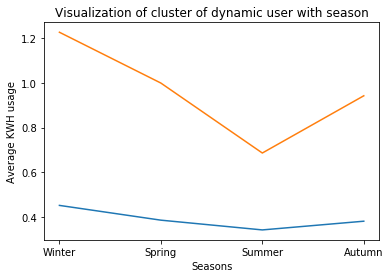

In [0]:
import matplotlib.pyplot as plt
plt.plot(["Winter", "Spring", "Summer", "Autumn"],y_axis[0])
plt.plot(["Winter", "Spring", "Summer", "Autumn"],y_axis[1])
plt.xlabel("Seasons")
plt.ylabel("Average KWH usage")
plt.title("Visualization of cluster of dynamic user with season")
plt.show()

In [0]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

sillhoute_scores = []
n_cluster = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]

X = new_df[["Summer","Winter","Spring","Autumn"]].values.copy()
    
# Very important to scale!
sc = MinMaxScaler()
X = sc.fit_transform(X)

for n_cluster in n_cluster:    
    kmeans = KMeans(n_clusters=n_cluster)
    cluster_found = kmeans.fit_predict(X)
    sillhoute_scores.append(silhouette_score(X, kmeans.labels_))

Text(0.5, 1.0, 'Finding ideal number of clusters for dynamic user')

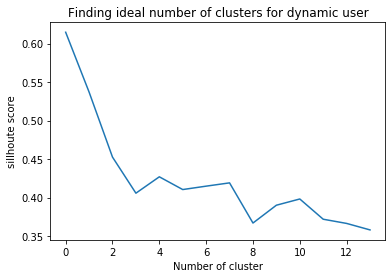

In [0]:
plt.plot(sillhoute_scores)
plt.xlabel("Number of cluster")
plt.ylabel("sillhoute score")
plt.title("Finding ideal number of clusters for dynamic user")

## Clustering electricty usage on the hour of the day

In [0]:
def find_plot_silhoutte(foo_df, foo_title):
    cols_to_use = ['LCLid', 'DateTime', 'KWH/hh']
    temp_df = foo_df[cols_to_use]
    temp_df["DateTime"] = temp_df["DateTime"].dt.hour
    groupby = temp_df.groupby(['LCLid', 'DateTime'])["KWH/hh"].mean()
    groupby = groupby.reset_index()
    groupby = groupby.drop(['LCLid'], axis=1)
    X = groupby.values

    sillhoute_scores = []
    n_cluster_list = np.arange(2,25).astype(int)    # Max since max hours are 25-1
        
    # Very important to scale!
    sc = MinMaxScaler()
    X = sc.fit_transform(X)

    for i in tqdm(n_cluster_list):
        kmeans = KMeans(n_clusters=i)
        cluster_found = kmeans.fit_predict(X)
        sillhoute_scores.append(silhouette_score(X, kmeans.labels_))

    fig = px.line(sillhoute_scores, y=sillhoute_scores, x=np.arange(2,25))
    fig.update_layout(
        title_text='Silhoutte Score for {} Groups'.format(foo_title),
        xaxis_title = 'Number of Clusters',
        yaxis_title = 'Sillhoute Score',
        xaxis = dict(
            tickmode = 'array',
            tickvals = n_cluster_list,
            ticktext = n_cluster_list
        )
    )
    fig.show()

In [0]:
def cluster_hourly_usage(foo_df, foo_title):
    cols_to_use = ['LCLid', 'DateTime', 'KWH/hh']
    temp_df = foo_df[cols_to_use]
    temp_df["DateTime"] = temp_df["DateTime"].dt.hour

    groupby = temp_df.groupby(['LCLid', 'DateTime'])["KWH/hh"].mean()
    groupby = groupby.reset_index()

    fig = px.line(groupby, x='DateTime', y='KWH/hh', color='LCLid')
    fig.update_layout(
        title_text = 'Mean Hourly Usage for {} Groups'.format(foo_title),
        yaxis_title = "KWH/hh",
        xaxis_title = "Hour of the Day",
        showlegend=False,
        xaxis = dict(
        tickmode = 'array',
        tickvals = np.arange(24),
        ticktext = np.arange(24)
        )
    )
    fig.show()

    groupby = groupby.drop(['LCLid'], axis=1)
    X = groupby.values

    kmeans = KMeans(n_clusters=3)
    cluster_found = kmeans.fit_predict(X)

    groupby['cluster'] = cluster_found
    cluster_avg = groupby.groupby(['cluster', 'DateTime'])["KWH/hh"].mean()
    cluster_avg = cluster_avg.reset_index()
    fig = px.line(cluster_avg, x="DateTime", y="KWH/hh", color="cluster")
    fig.update_layout(
        title_text = '{} Groups Clustering by Hour of the Day'.format(foo_title),
        xaxis_title = "Hour of the Day",
        xaxis = dict(
        tickmode = 'array',
        tickvals = np.arange(24),
        ticktext = np.arange(24)
        )
    )
    fig.show()

In [0]:
find_plot_silhoutte(df, 'STD')  

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [47:47<00:00, 124.69s/it]


In [0]:
cluster_hourly_usage(df, 'STD')

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [0]:
find_plot_silhoutte(df2, 'DToU')

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:12<00:00,  1.86it/s]


In [0]:
cluster_hourly_usage(df2, 'DToU')

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Outlier Analysis

## Standard customer

In [0]:
standard_cus.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group
0,MAC000002,0.571854,0.833510,0.778410,0.761370,Affluent
0,MAC000003,0.765520,1.698861,1.173445,1.080151,Adversity
0,MAC000004,0.095731,0.115601,0.107319,0.107810,Affluent
0,MAC000006,0.153897,0.192760,0.183457,0.186135,Adversity
0,MAC000007,0.513453,0.659852,0.653722,0.519475,Comfortable


In [0]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
standard_cus["Acorn_group"] = le.fit_transform(standard_cus["Acorn_group"])

In [0]:
standard_cus.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group
0,MAC000002,0.571854,0.833510,0.778410,0.761370,2
0,MAC000003,0.765520,1.698861,1.173445,1.080151,1
0,MAC000004,0.095731,0.115601,0.107319,0.107810,2
0,MAC000006,0.153897,0.192760,0.183457,0.186135,1
0,MAC000007,0.513453,0.659852,0.653722,0.519475,3


In [0]:
from sklearn.ensemble import IsolationForest
isforest = IsolationForest(max_samples="auto")
labels = isforest.fit_predict(standard_cus[["Summer","Winter","Spring","Autumn","Acorn_group"]])
labels

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\sklearn\ensemble\iforest.py:237: FutureWarning:

default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



array([ 1, -1,  1, ...,  1,  1,  1])

In [0]:
len(labels)

3043

In [0]:
standard_cus["outlier"] = labels

In [0]:
standard_cus["outlier"].value_counts()

 1    2738
-1     305
Name: outlier, dtype: int64

In [0]:
standard_cus[standard_cus["outlier"]==-1]

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group,outlier
0,MAC000003,0.765520,1.698861,1.173445,1.080151,1,-1
0,MAC000010,1.410513,1.895875,1.563577,1.567246,3,-1
0,MAC000016,0.022814,0.173175,0.050289,0.013073,1,-1
0,MAC000023,0.613825,1.008481,0.976567,0.931883,0,-1
0,MAC000034,0.444911,2.889775,2.202488,0.738187,2,-1
...,...,...,...,...,...,...,...
0,MAC003779,0.524584,1.804989,1.433068,0.867028,1,-1
0,MAC003795,1.272956,1.405611,1.604670,1.153396,3,-1
0,MAC003799,1.378237,1.469722,1.503355,1.574133,3,-1
0,MAC003802,1.077449,1.548390,1.307513,1.358109,3,-1


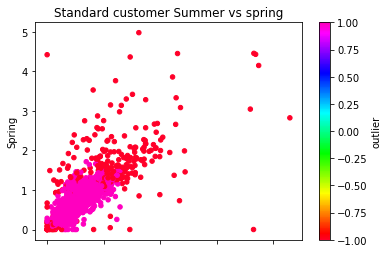

In [0]:
standard_cus.plot.scatter('Summer', 'Spring', c='outlier', colormap='gist_rainbow', title="Standard customer Summer vs spring")

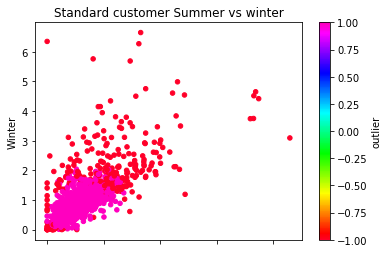

In [0]:
standard_cus.plot.scatter('Summer', 'Winter', c='outlier', colormap='gist_rainbow', title="Standard customer Summer vs winter")

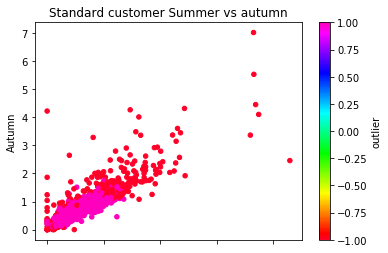

In [0]:
standard_cus.plot.scatter('Summer', 'Autumn', c='outlier', colormap='gist_rainbow', title="Standard customer Summer vs autumn")

## Dynamic Customer

In [0]:
dynamic_cust.head()

,LCLid,Summer,Winter,Spring,Autumn,Acorn_group
0,MAC005157,0.340453,0.484175,0.396168,0.485832,Adversity
0,MAC005159,0.873525,1.228214,1.109679,1.046674,Affluent
0,MAC005160,0.594076,0.806465,0.749956,0.731964,Affluent
0,MAC005161,0.319754,0.450369,0.364356,0.343508,Comfortable
0,MAC005162,0.211162,0.916742,0.585099,0.381050,Comfortable


In [0]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
dynamic_cust["Acorn_group"] = le.fit_transform(dynamic_cust["Acorn_group"])

In [0]:
from sklearn.ensemble import IsolationForest
isforest = IsolationForest(max_samples="auto")
labels = isforest.fit_predict(dynamic_cust[["Summer","Winter","Spring","Autumn","Acorn_group"]])
labels

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\sklearn\ensemble\iforest.py:237: FutureWarning:

default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.

C:\Users\Hamza\.conda\envs\env_full\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,
       -1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
        1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1, -1])

In [0]:
dynamic_cust["outlier"] = labels

In [0]:
dynamic_cust["outlier"].value_counts()

 1    81
-1     9
Name: outlier, dtype: int64

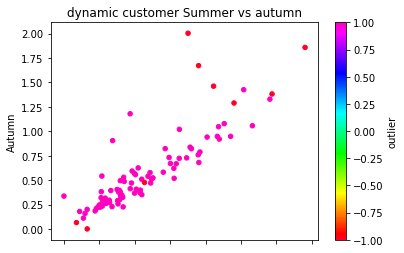

In [0]:
dynamic_cust.plot.scatter('Summer', 'Autumn', c='outlier', colormap='gist_rainbow',title="dynamic customer Summer vs autumn")

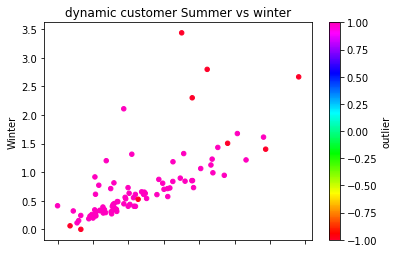

In [0]:
dynamic_cust.plot.scatter('Summer', 'Winter', c='outlier', colormap='gist_rainbow', title="dynamic customer Summer vs winter")

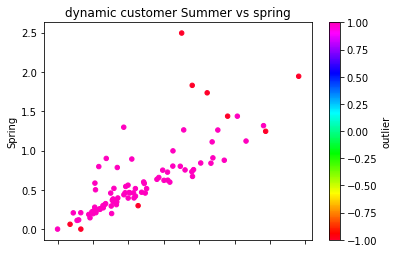

In [0]:
dynamic_cust.plot.scatter('Summer', 'Spring', c='outlier', colormap='gist_rainbow',title="dynamic customer Summer vs spring")